In [1]:
#set which GPU you wanna use
import os
import pandas as pd
os.environ["CUDA_VISIBLE_DEVICES"]='2' 

In [2]:
from data_utils import SmthSmthSequenceGenerator

Using TensorFlow backend.


In [3]:
#the weights are in vageesh's folder
#import sys
#sys.path.insert(0, r'/project/video_prediction/vageesh/Predictive-video-classification/prednet-smth-smth')
#path = '/project/video_prediction/vageesh/Predictive-video-classification/prednet-smth-smth'

In [4]:
import numpy as np
from six.moves import cPickle
from collections import defaultdict

from keras import backend as K
from keras.models import Model, model_from_json
from keras.layers import Input, Dense, Flatten

from prednet import PredNet
from viz_utils import plot_video
import matplotlib.pyplot as plt

In [9]:
weights_file = 'model_fps6_n20_vids75k/checkpoint-best.hdf5'
json_file = 'model_fps6_n20_vids75k/model.json'

In [10]:
# Load trained model
f = open(json_file, 'r')
json_string = f.read()
f.close()
train_model = model_from_json(json_string, custom_objects = {'PredNet': PredNet})
train_model.load_weights(weights_file)

In [11]:
# get config
layer_config = train_model.layers[1].get_config()

In [12]:
all_output_modes = ['R0', 'R1', 'R2', 'R3', 'A0', 'A1', 'A2', 'A3', 'Ahat0', 'Ahat1', 'Ahat2', 'Ahat3', 'E0', 'E1', 'E2', 'E3']

In [13]:
#create models for outputs
test_models = []
batch_size = 8
nt = 48

for output_mode in all_output_modes:
    layer_config['output_mode'] = output_mode    
    data_format = layer_config['data_format'] if 'data_format' in layer_config else layer_config['dim_ordering']
    test_prednet = PredNet(weights=train_model.layers[1].get_weights(), **layer_config)
    input_shape = list(train_model.layers[0].batch_input_shape[1:])
    input_shape[0] = nt
    inputs = Input(shape=tuple(input_shape))
    predictions = test_prednet(inputs)
    test_model = Model(inputs=inputs, outputs=predictions)
    test_models.append((test_model, output_mode))

In [14]:
#load data and initialize generator
df = pd.read_csv("/data/videos/something-something-v2/preprocessed/data.csv")
test_data = df[df['split'] == 'val']

test_generator  = SmthSmthSequenceGenerator(test_data
                                    , nframes = 48
                                    , batch_size = 8
                                    , shuffle=True, seed=42
                                    , target_im_size=(64, 80)
                                    , output_mode = 'label'                                    
                                    , nframes_selection_mode = "smth-smth-baseline-method")

/usr/local/lib/python3.5/dist-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (11,12,13) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
holdout = df[df.split == "holdout"]

In [ ]:
pd.options.display.max_rows = 4000
(holdout.template.value_counts())

In [ ]:
#freq vs infreq
putting_freq = ["Moving [something] down, Putting [something] on a surface", "Putting [something] onto [something]"] 
putting_infreq = ["Putting [something] onto [something else that cannot support it] so it falls down",
"Putting [something] on the edge of [something] so it is not supported and falls down", 
"Putting [something] onto a slanted surface but it doesn't glide down"]
#hand movement difference
showing = ["Showing [something] to the camera"]
digging = ["Digging [something] out of [something]"]
#objects
throwing = ["Throwing [something]"]
#ego-motion
ego_motion = ["Turning the camera left while filming [something]", 
          "Turning the camera downwards while filming [something]", "Approaching [something] with your camera"]
no_ego_motion = ["Folding [something]", "Pouring [something] into [something]"]

In [15]:
#generate new batch
X_test, labels = test_generator.next()
X_test.shape

(8, 48, 64, 80, 3)

In [16]:
#get outputs
X_hats = []
for test_model, output_mode in test_models:
    X_hat = test_model.predict(X_test, batch_size)
    print(output_mode, np.shape(X_hat))
    X_hats.append((X_hat, output_mode))

R0 (8, 48, 64, 80, 3)
R1 (8, 48, 32, 40, 48)
R2 (8, 48, 16, 20, 96)
R3 (8, 48, 8, 10, 192)
A0 (8, 48, 64, 80, 3)
A1 (8, 48, 32, 40, 48)
A2 (8, 48, 16, 20, 96)
A3 (8, 48, 8, 10, 192)
Ahat0 (8, 48, 64, 80, 3)
Ahat1 (8, 48, 32, 40, 48)
Ahat2 (8, 48, 16, 20, 96)
Ahat3 (8, 48, 8, 10, 192)
E0 (8, 48, 64, 80, 6)
E1 (8, 48, 32, 40, 96)
E2 (8, 48, 16, 20, 192)
E3 (8, 48, 8, 10, 384)


In [ ]:
#checking the generated vids to later choose
for v, lbl in zip(X_test, labels):
    print("Label=",set(test_generator.df[test_generator.df.template_id==lbl].template))
    plot_video(v, stats=False)

In [57]:
#function that outputs every possible layer & channel's output
#small outputs should be made smaller (so they are easier to see)
#not saving anything, atm this is just for experimenting

#if plot is empty, don't plot it just write empty - count it
import matplotlib.gridspec as gridspec

def plot_everything(list_of_outputs):
    
    for index, (X_hat, output_mode) in enumerate(list_of_outputs):
        
        channels = np.shape(X_hat)[3]
        frames = np.shape(X_hat)[0]
        X_hat_to_check_for_zeros =  np.transpose(X_hat, (3,0,1,2))
        count_zeros = 0
        
        for channel in range(channels):
            
            X_hat_t = np.transpose(X_hat, (0,3,1,2))
            if np.all(X_hat_to_check_for_zeros[channel] == np.float(0)):
                print("Channel empty:" + (output_mode) + str(channel))
            #if X_hat_to_check_for_zeros[channel].nonzero != 0:               
                                            
            else:               
                plt.figure(figsize = (15, 15))        
                for frame in range(frames):
                    #print(X_hat_t[frame][channel])
                    gs = gridspec.GridSpec(3, frames)
                    gs.update(wspace=0., hspace=0.)            

                    plt.subplot(gs[frame])

                    plt.imshow(X_hat_t[frame][channel], interpolation='none')

                    plt.tick_params(axis='both', which='both', bottom='off', top='off', left='off', 
                                        right='off', labelbottom='off', labelleft='off')

                    if frame == 0: 
                        plt.ylabel(output_mode, fontsize=10)              
                        plt.xlabel("CHANNEL " + str(channel+1), fontsize=10)
                              
                
            plt.show()
            
        #return zeros

#### Sample 1: Moving something closer to the camera
* original vid

In [58]:
#plot_video(X_test[6])

* all (part, layer, channel) outputs of the prednet for frames 30-40

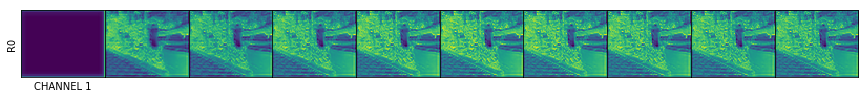

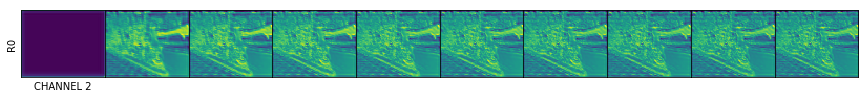

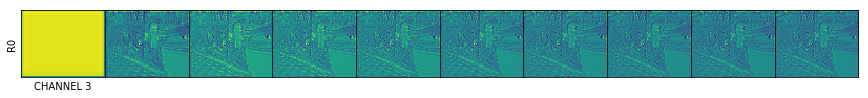

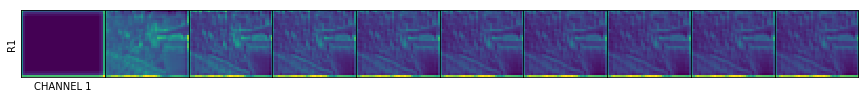

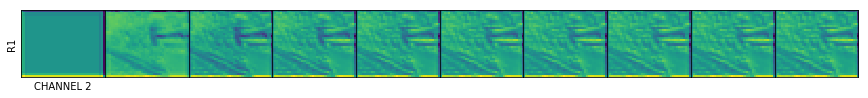

...

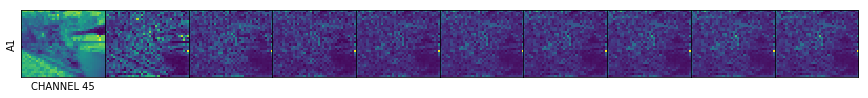

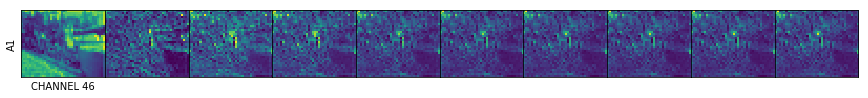

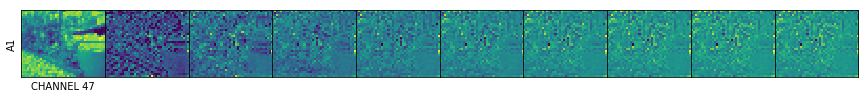

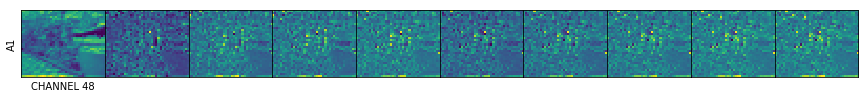

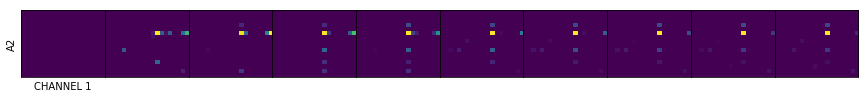

Channel empty:A21


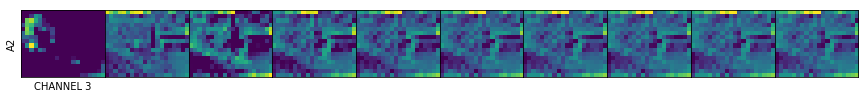

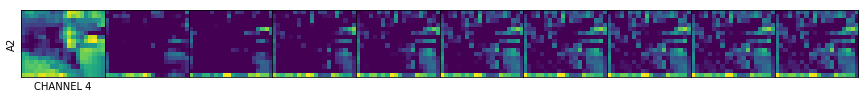

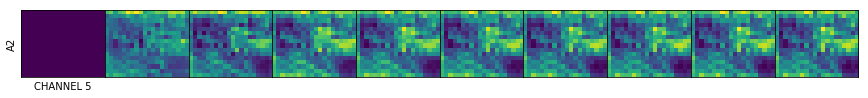

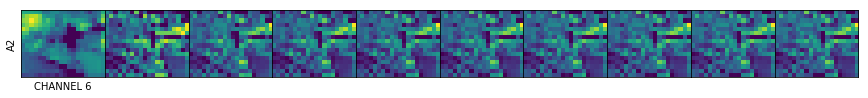

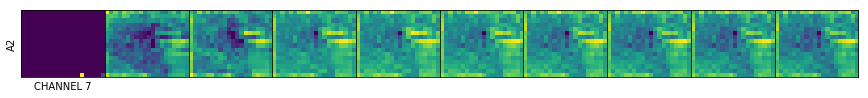

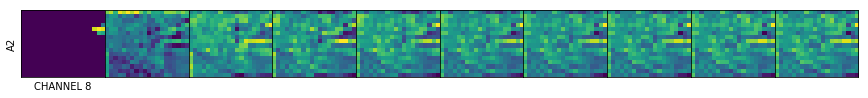

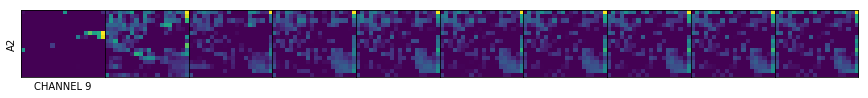

Channel empty:A29
Channel empty:A210


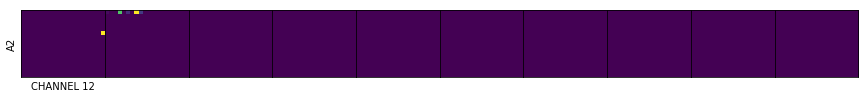

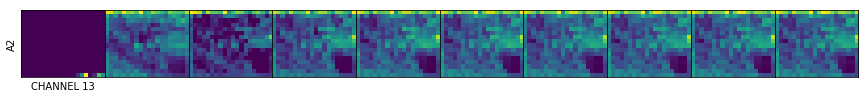

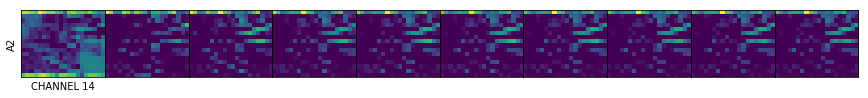

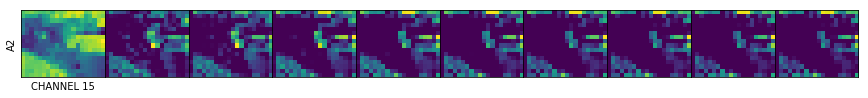

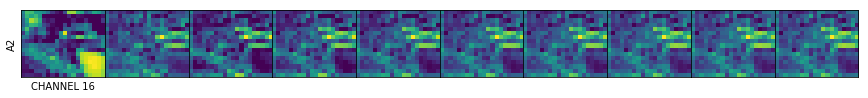

...

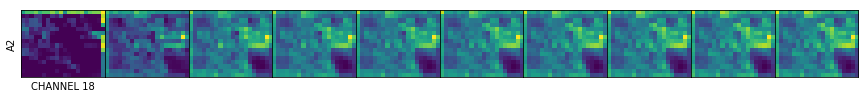

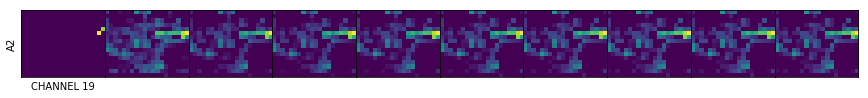

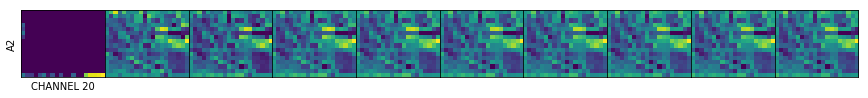

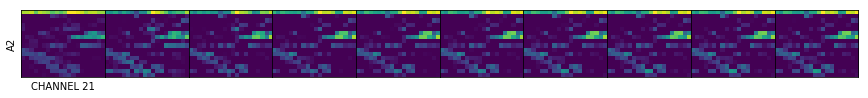

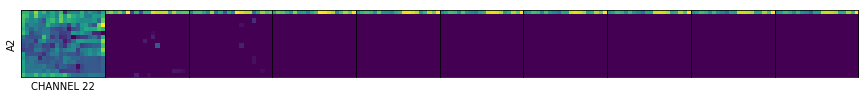

Channel empty:A222


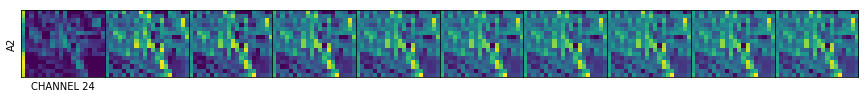

Channel empty:A224
Channel empty:A225


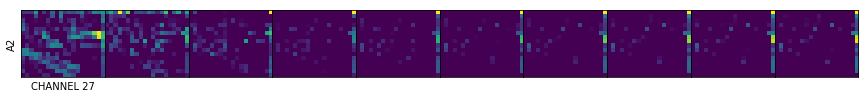

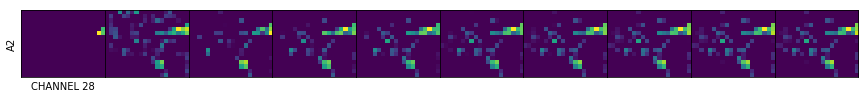

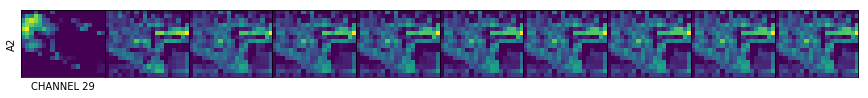

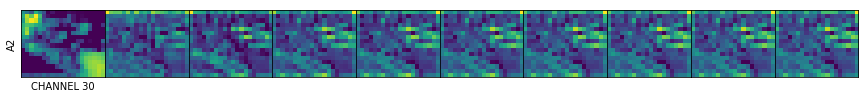

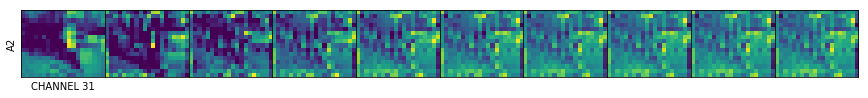

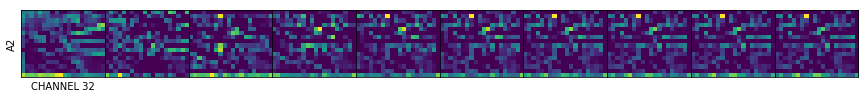

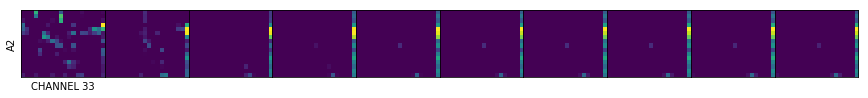

Channel empty:A233


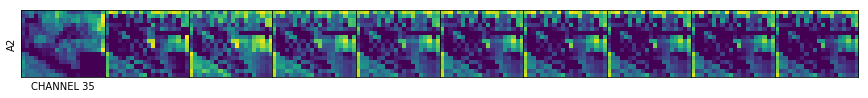

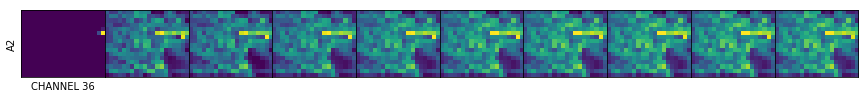

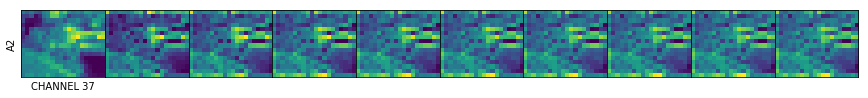

Channel empty:A237


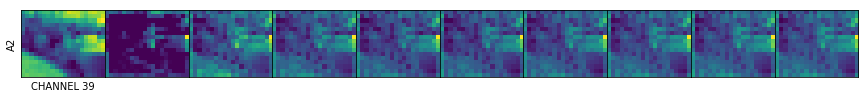

Channel empty:A239
Channel empty:A240


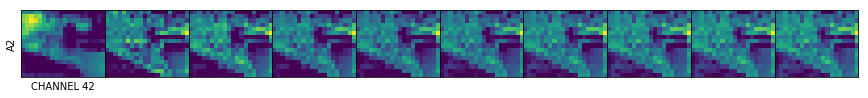

Channel empty:A242
Channel empty:A243


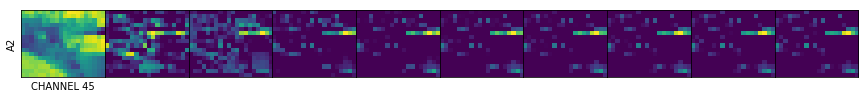

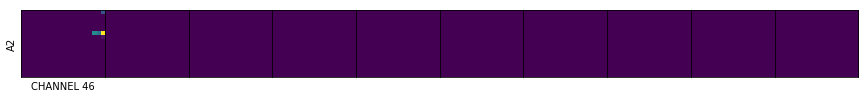

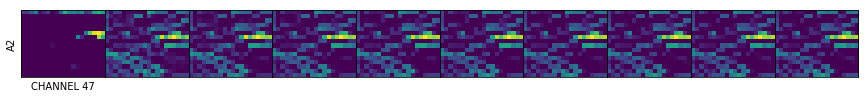

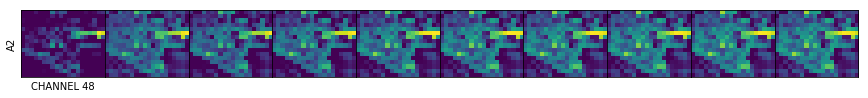

Channel empty:A248


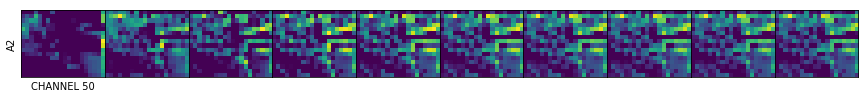

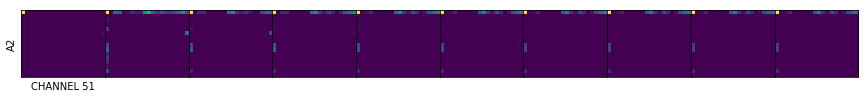

Channel empty:A251
Channel empty:A252


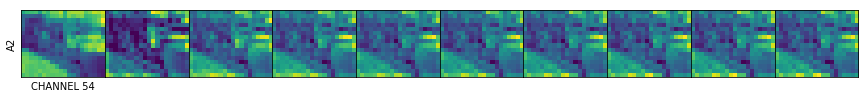

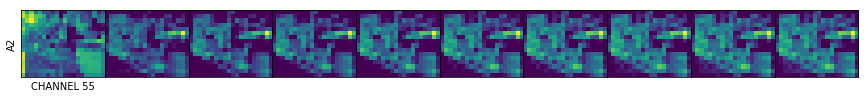

Channel empty:A255
Channel empty:A256


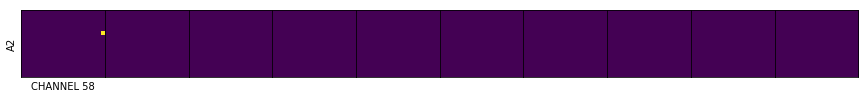

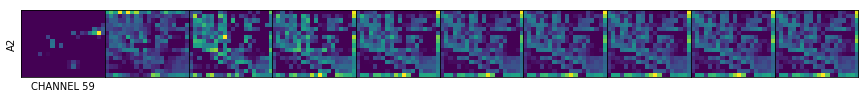

Channel empty:A259


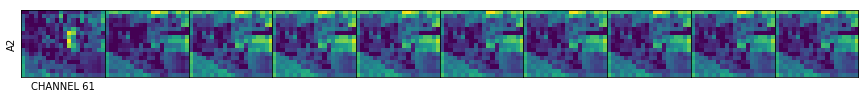

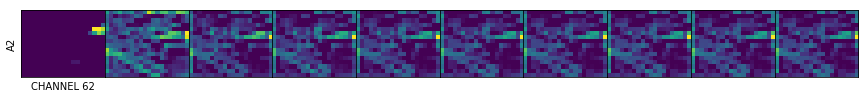

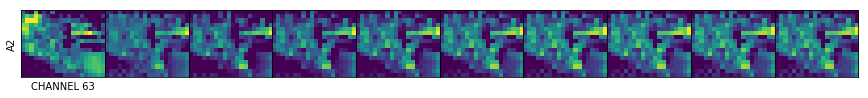

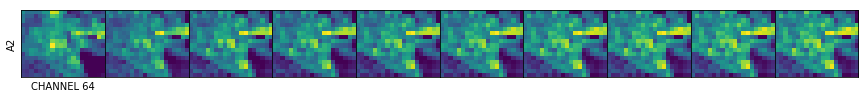

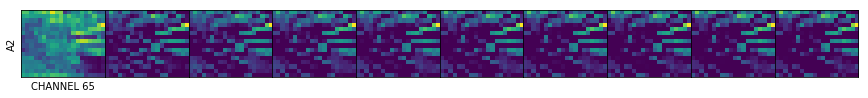

...

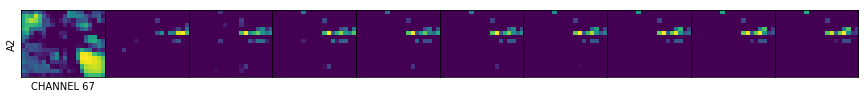

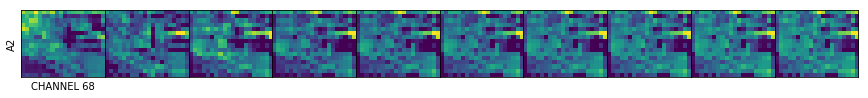

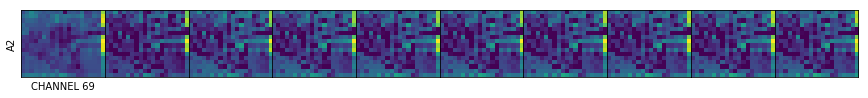

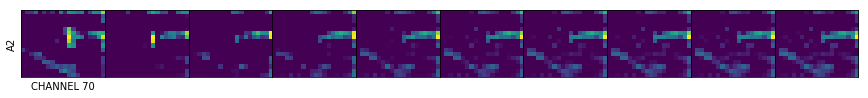

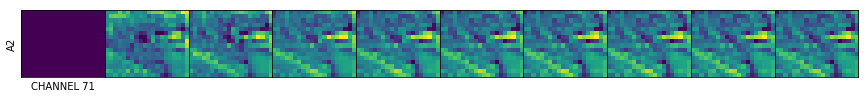

Channel empty:A271


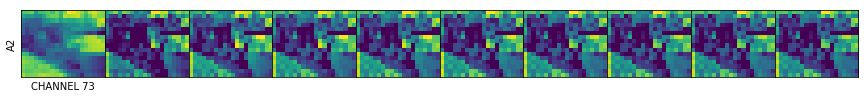

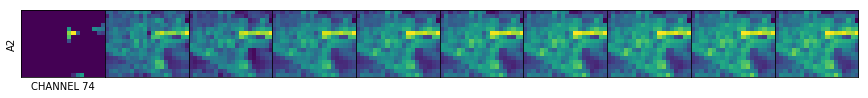

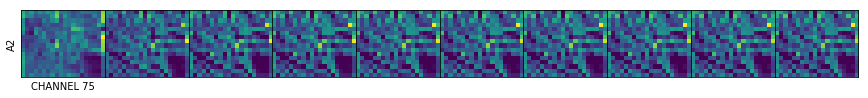

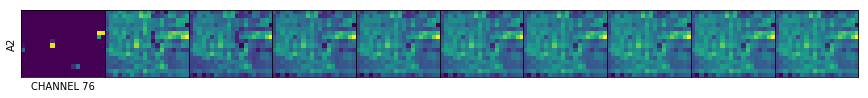

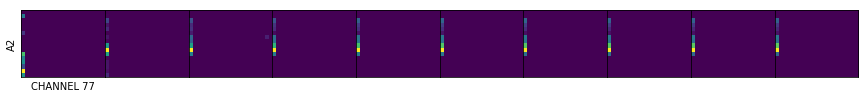

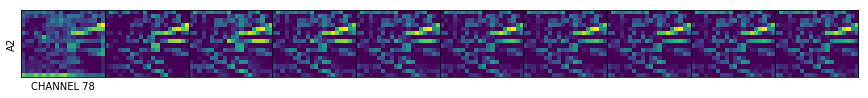

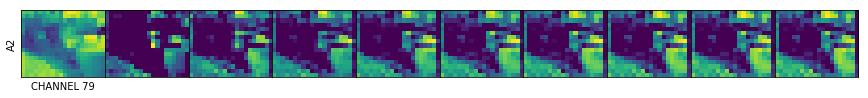

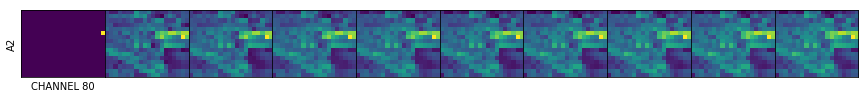

Channel empty:A280


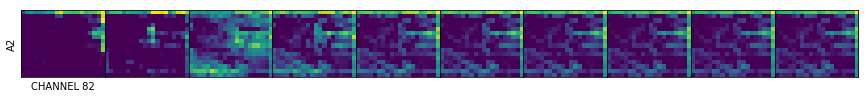

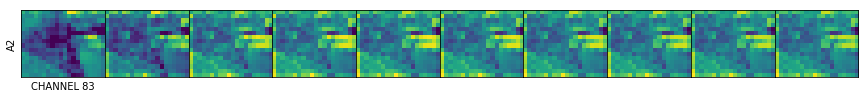

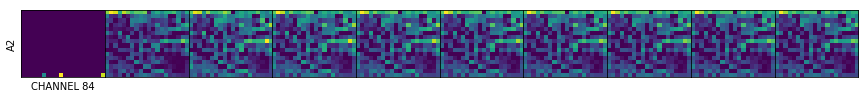

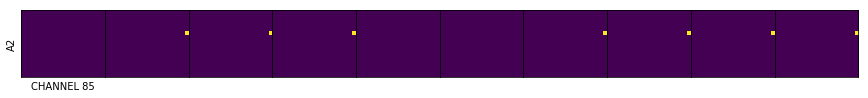

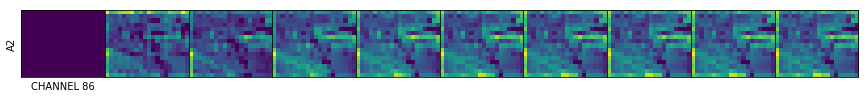

Channel empty:A286


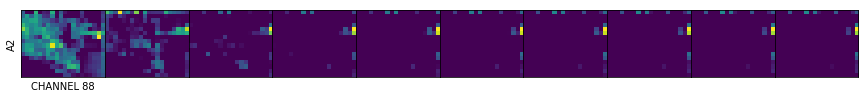

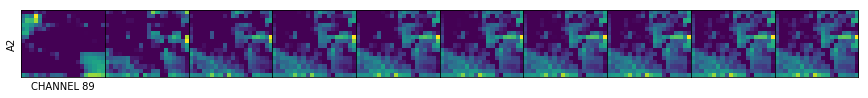

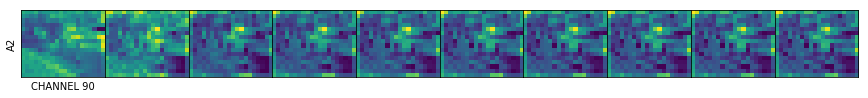

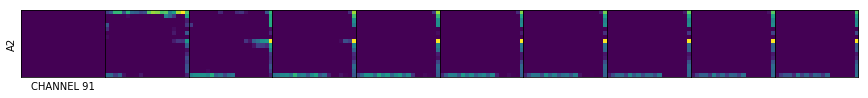

Channel empty:A291


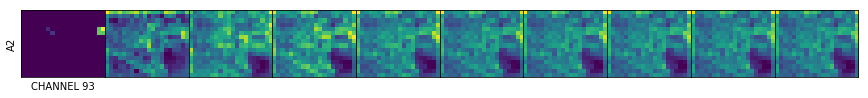

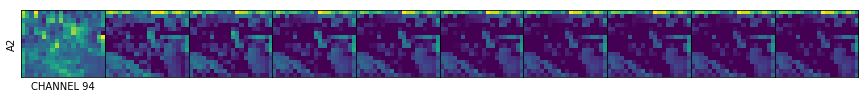

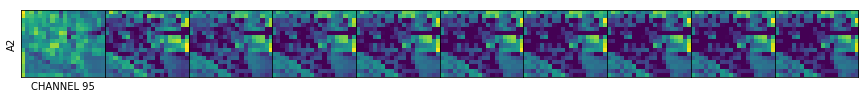

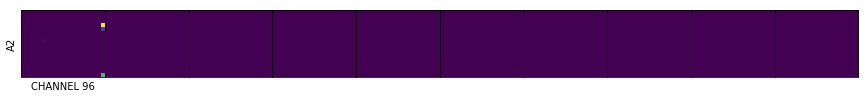

Channel empty:A30


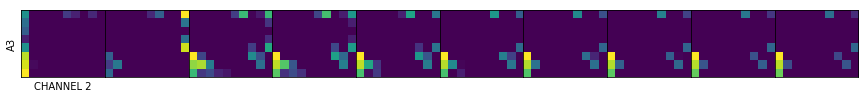

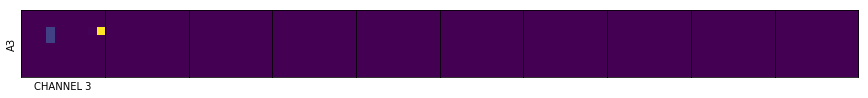

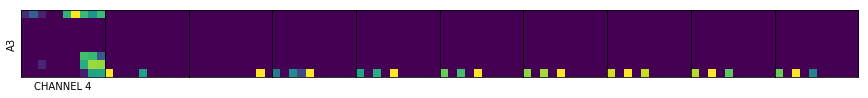

Channel empty:A34
Channel empty:A35


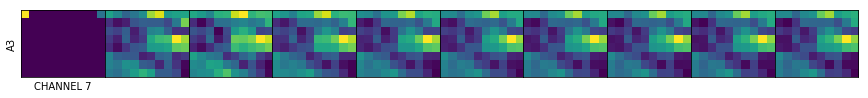

Channel empty:A37
Channel empty:A38
Channel empty:A39


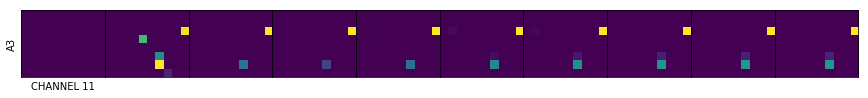

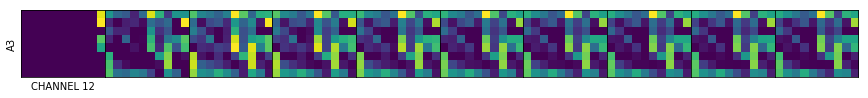

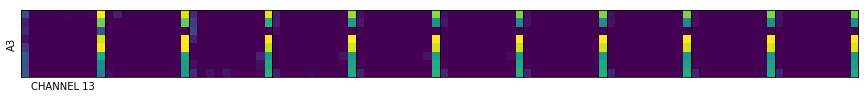

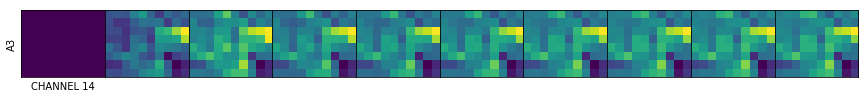

Channel empty:A314
Channel empty:A315


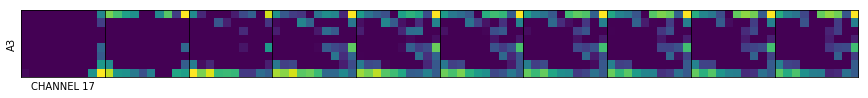

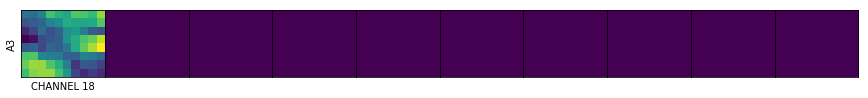

Channel empty:A318
Channel empty:A319
Channel empty:A320


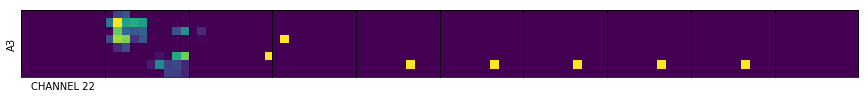

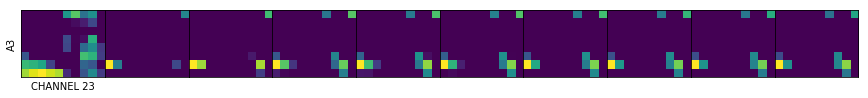

Channel empty:A323
Channel empty:A324


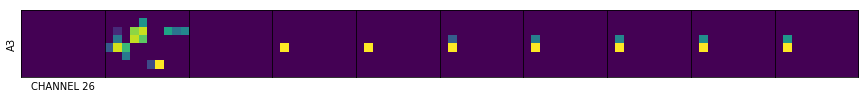

Channel empty:A326
Channel empty:A327
Channel empty:A328
Channel empty:A329
Channel empty:A330
Channel empty:A331


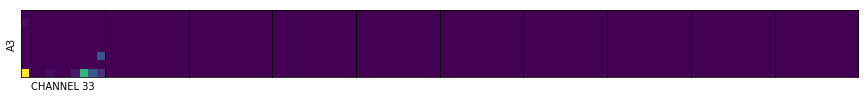

Channel empty:A333
Channel empty:A334
Channel empty:A335
Channel empty:A336
Channel empty:A337


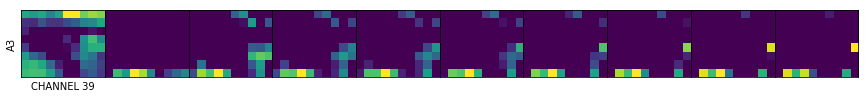

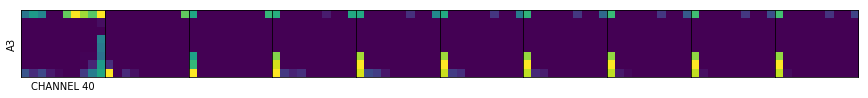

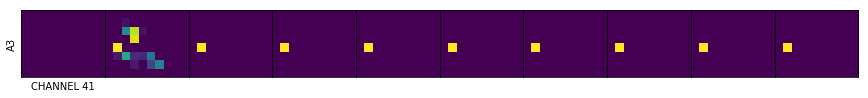

Channel empty:A341


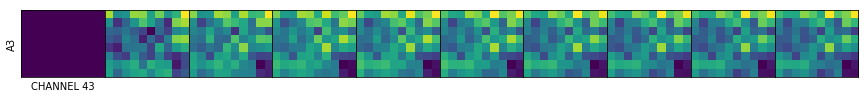

Channel empty:A343
Channel empty:A344
Channel empty:A345
Channel empty:A346
Channel empty:A347
Channel empty:A348
Channel empty:A349
Channel empty:A350
Channel empty:A351


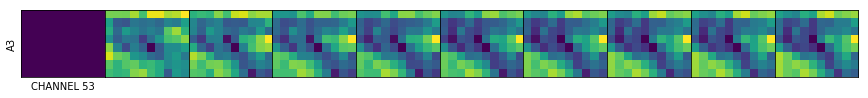

Channel empty:A353


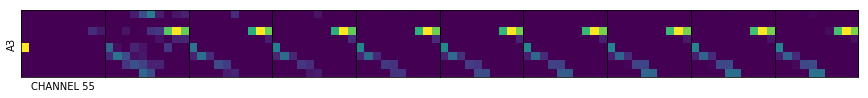

Channel empty:A355
Channel empty:A356
Channel empty:A357
Channel empty:A358
Channel empty:A359


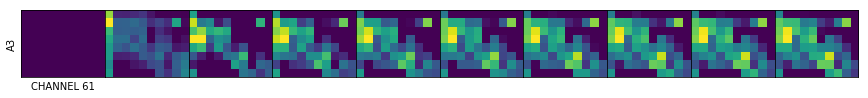

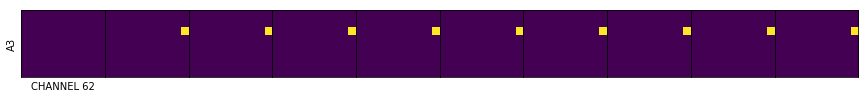

Channel empty:A362
Channel empty:A363


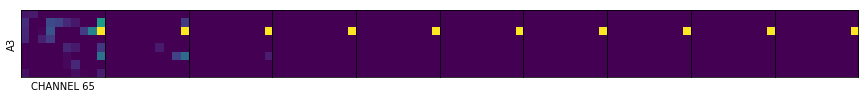

Channel empty:A365


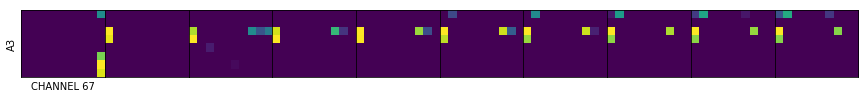

Channel empty:A367


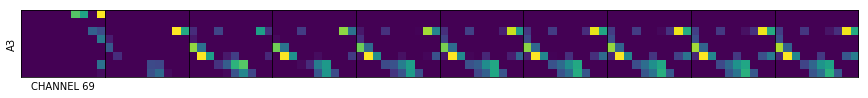

Channel empty:A369


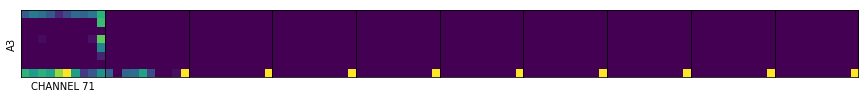

Channel empty:A371
Channel empty:A372
Channel empty:A373
Channel empty:A374
Channel empty:A375


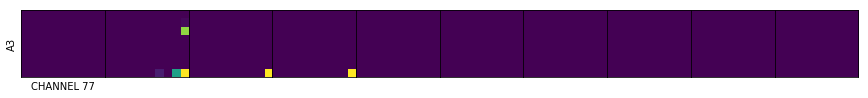

Channel empty:A377
Channel empty:A378
Channel empty:A379
Channel empty:A380
Channel empty:A381


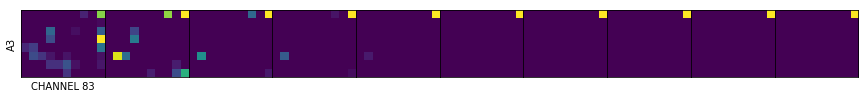

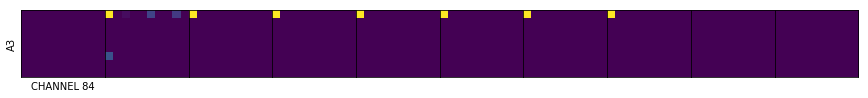

Channel empty:A384
Channel empty:A385


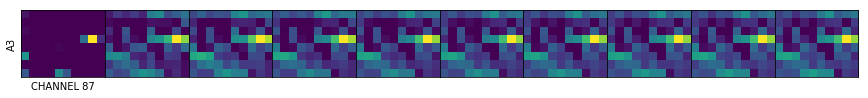

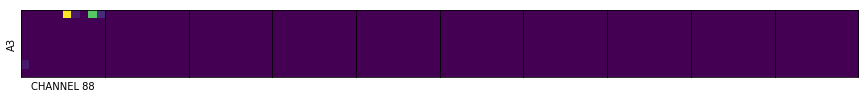

Channel empty:A388


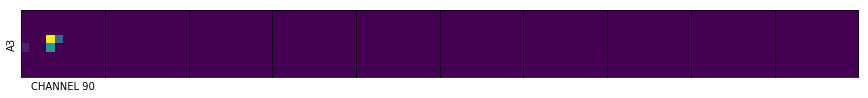

Channel empty:A390
Channel empty:A391
Channel empty:A392


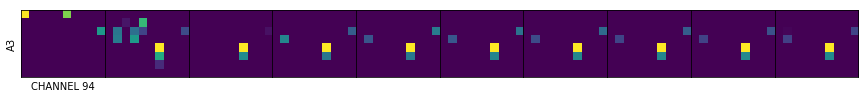

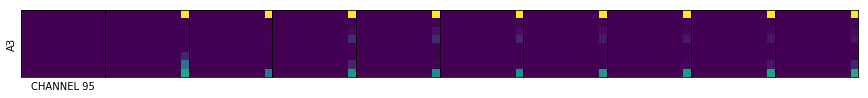

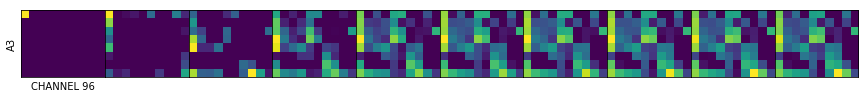

Channel empty:A396
Channel empty:A397


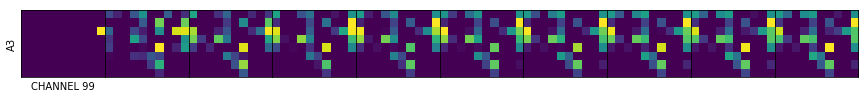

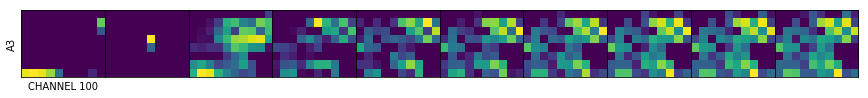

Channel empty:A3100


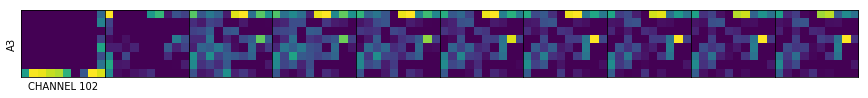

Channel empty:A3102


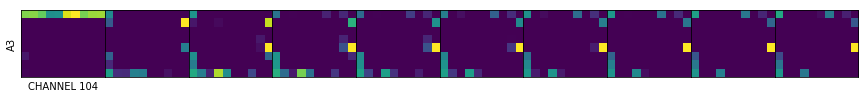

Channel empty:A3104
Channel empty:A3105
Channel empty:A3106
Channel empty:A3107


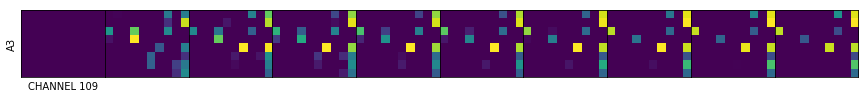

Channel empty:A3109
Channel empty:A3110
Channel empty:A3111
Channel empty:A3112


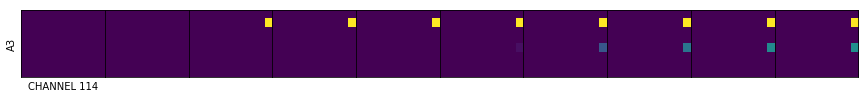

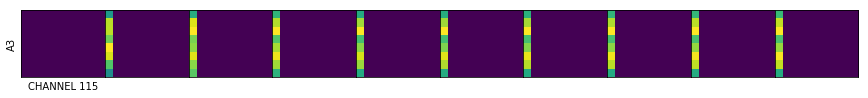

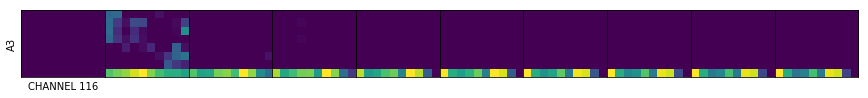

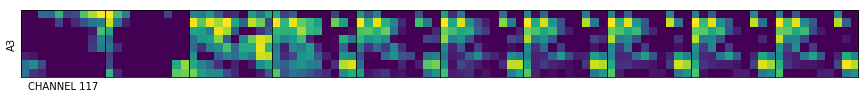

Channel empty:A3117


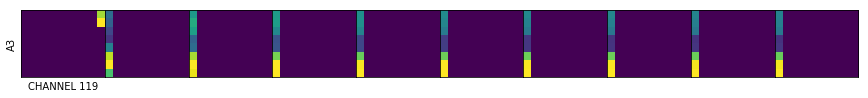

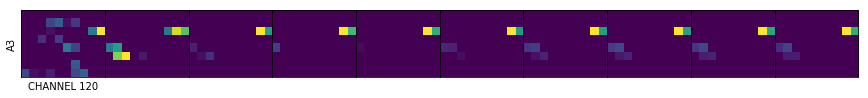

Channel empty:A3120


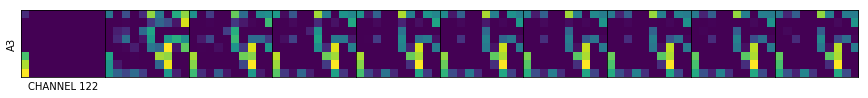

Channel empty:A3122
Channel empty:A3123


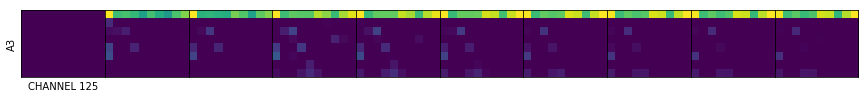

Channel empty:A3125
Channel empty:A3126


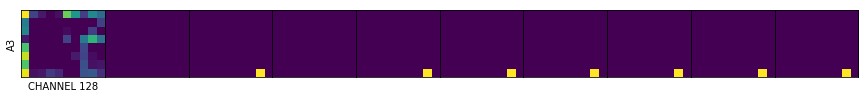

Channel empty:A3128
Channel empty:A3129


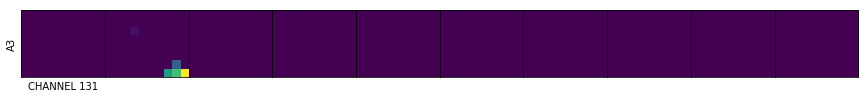

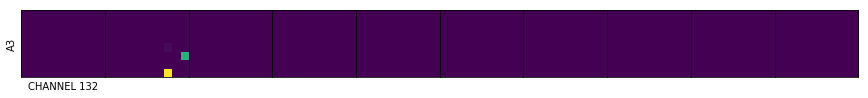

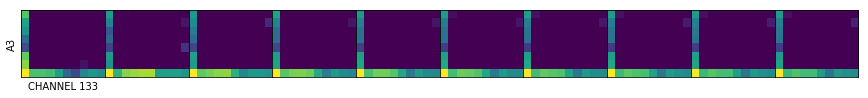

Channel empty:A3133


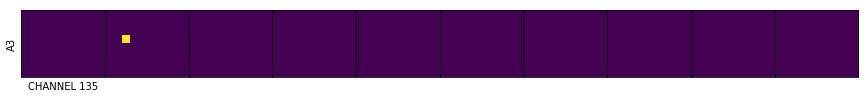

Channel empty:A3135
Channel empty:A3136
Channel empty:A3137


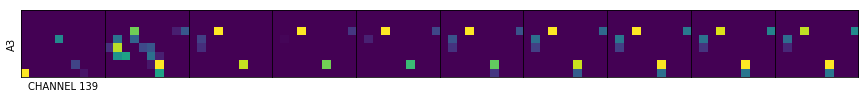

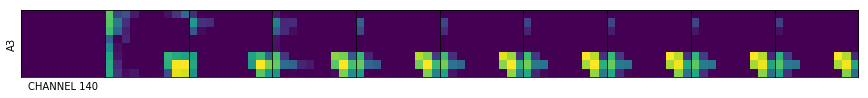

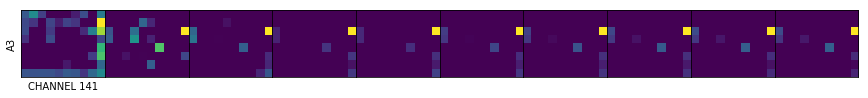

Channel empty:A3141


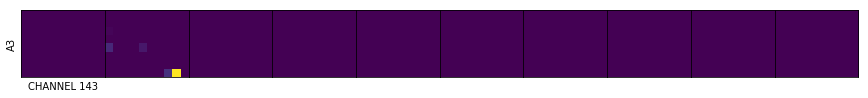

Channel empty:A3143
Channel empty:A3144


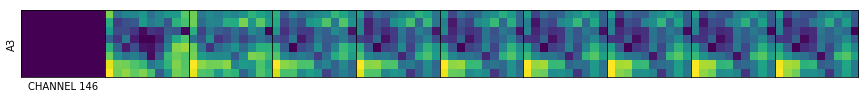

Channel empty:A3146


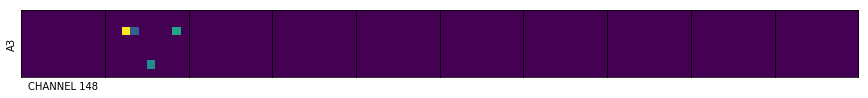

Channel empty:A3148
Channel empty:A3149
Channel empty:A3150


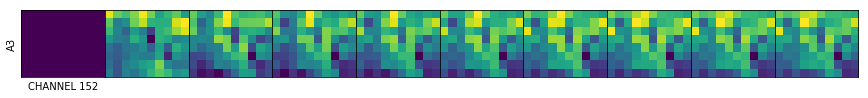

Channel empty:A3152
Channel empty:A3153
Channel empty:A3154


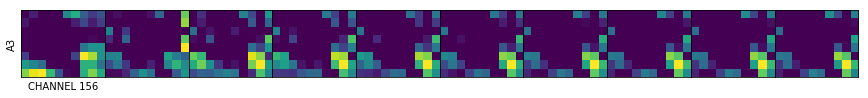

Channel empty:A3156
Channel empty:A3157


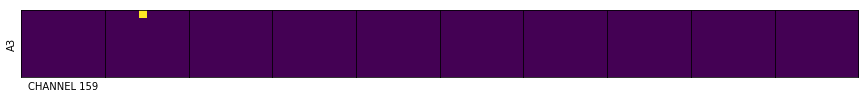

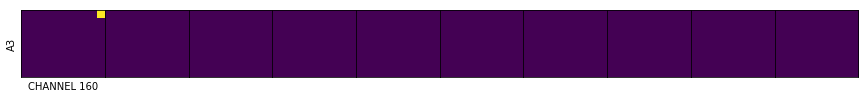

Channel empty:A3160
Channel empty:A3161


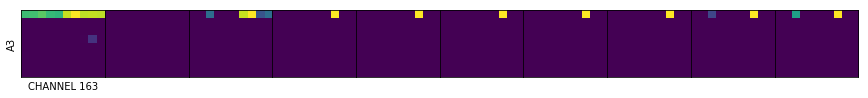

Channel empty:A3163
Channel empty:A3164


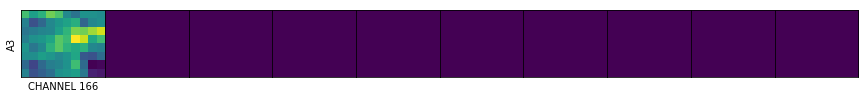

Channel empty:A3166
Channel empty:A3167


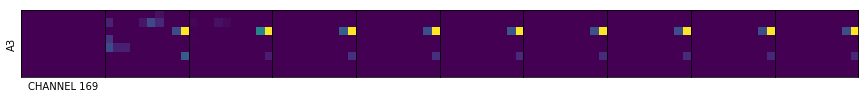

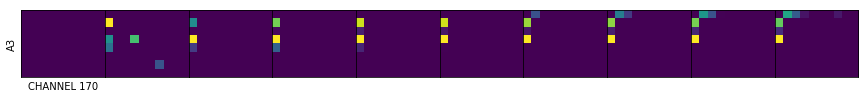

Channel empty:A3170
Channel empty:A3171


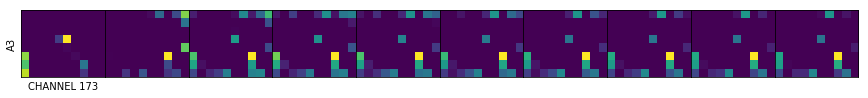

Channel empty:A3173
Channel empty:A3174
Channel empty:A3175


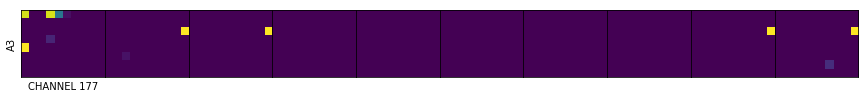

Channel empty:A3177


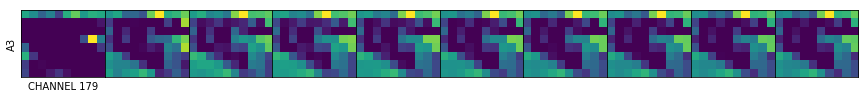

Channel empty:A3179


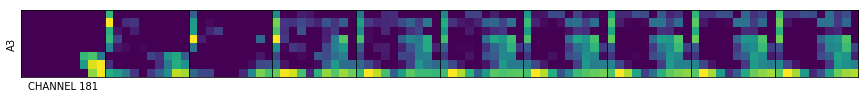

Channel empty:A3181


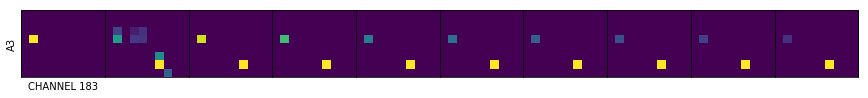

Channel empty:A3183
Channel empty:A3184
Channel empty:A3185
Channel empty:A3186
Channel empty:A3187


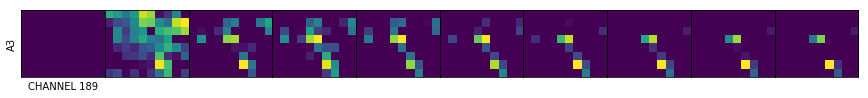

Channel empty:A3189


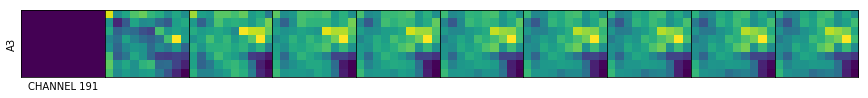

Channel empty:A3191


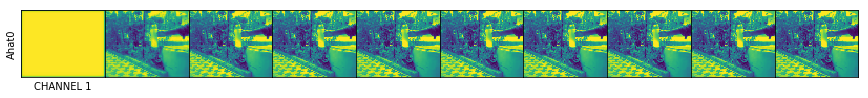

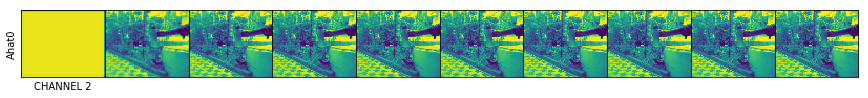

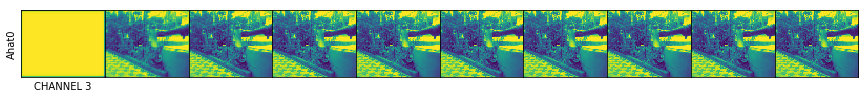

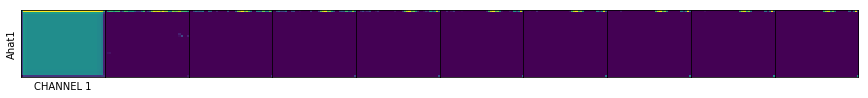

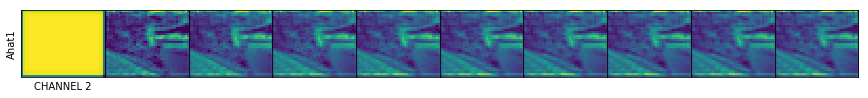

Channel empty:Ahat12
Channel empty:Ahat13
Channel empty:Ahat14
Channel empty:Ahat15
Channel empty:Ahat16
Channel empty:Ahat17


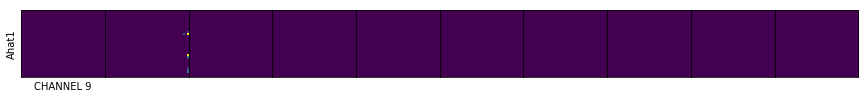

Channel empty:Ahat19


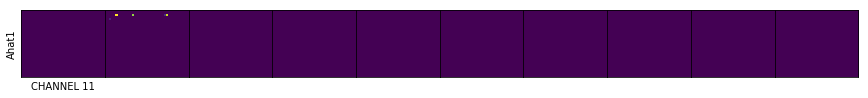

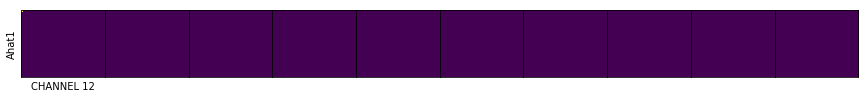

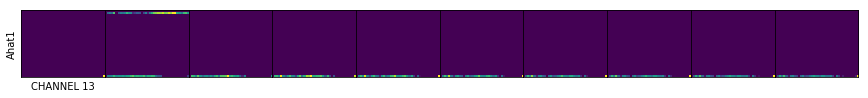

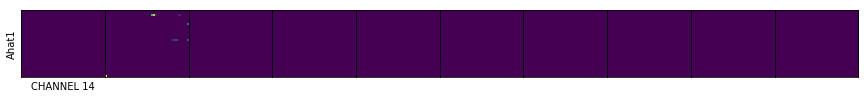

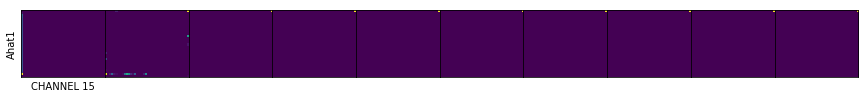

Channel empty:Ahat115
Channel empty:Ahat116


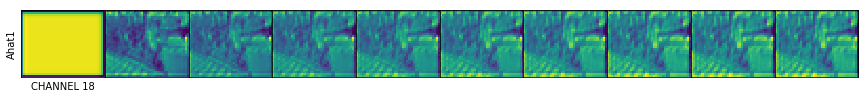

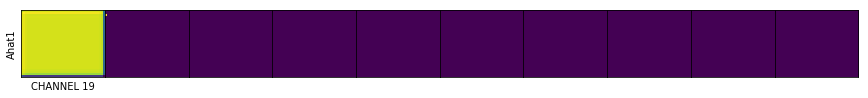

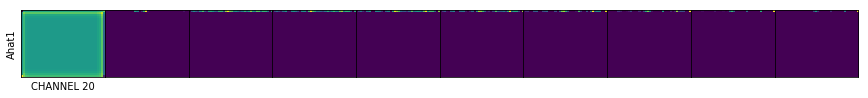

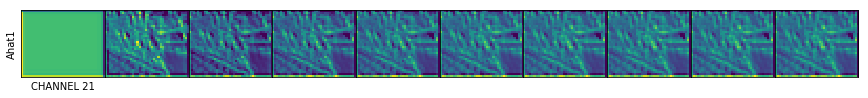

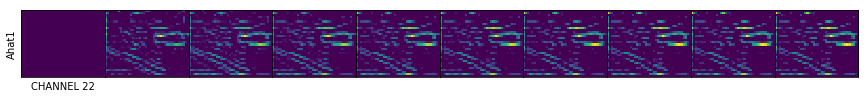

Channel empty:Ahat122


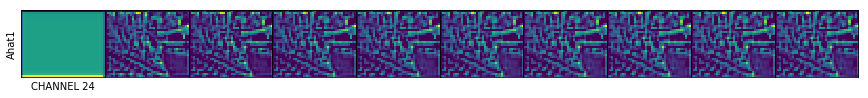

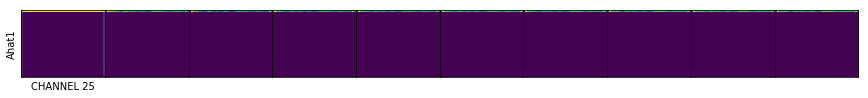

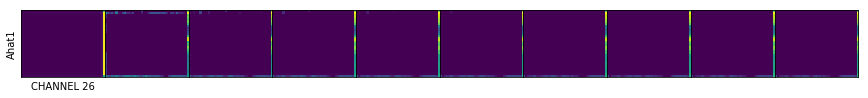

Channel empty:Ahat126


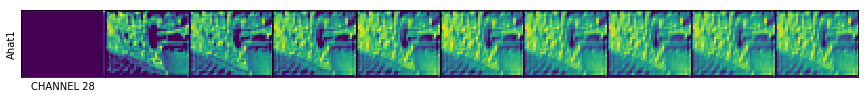

Channel empty:Ahat128
Channel empty:Ahat129
Channel empty:Ahat130


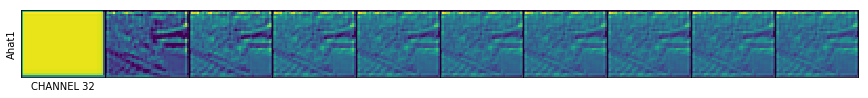

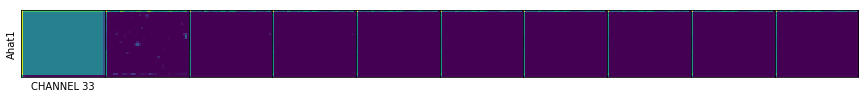

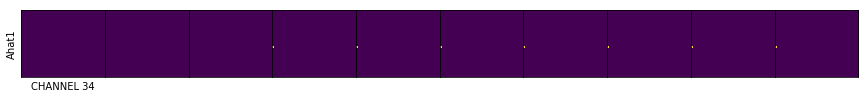

Channel empty:Ahat134


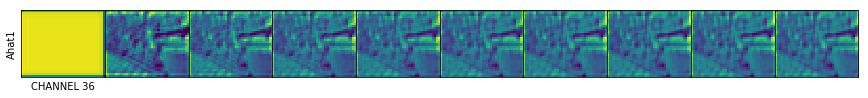

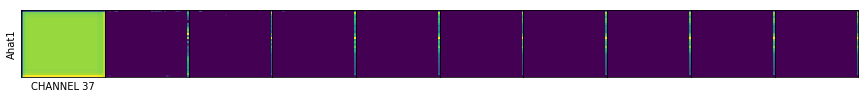

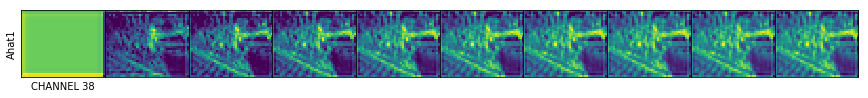

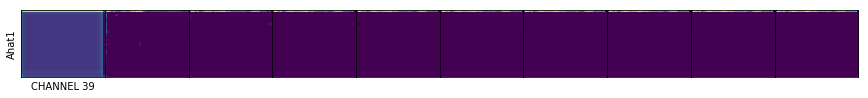

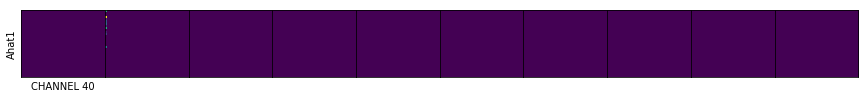

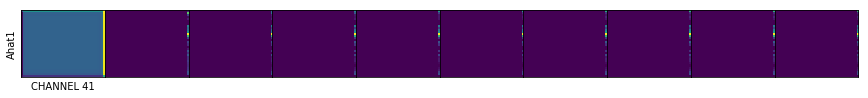

Channel empty:Ahat141
Channel empty:Ahat142


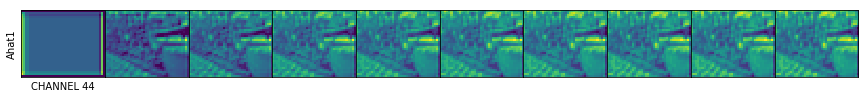

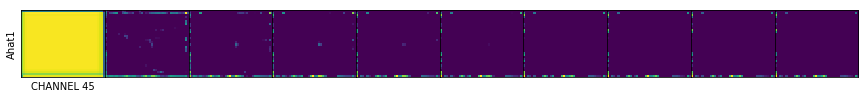

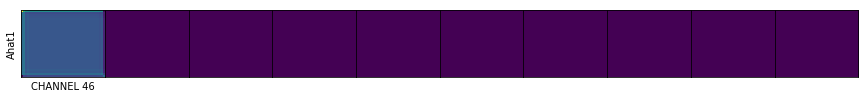

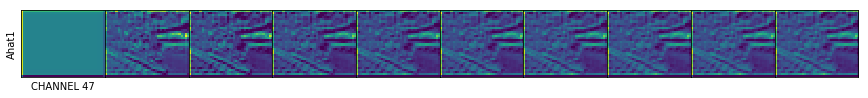

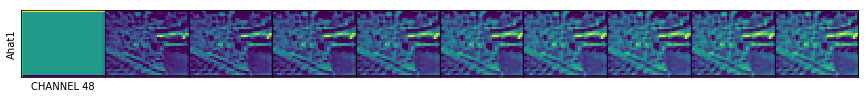

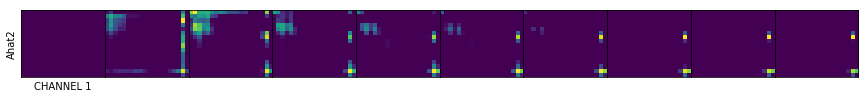

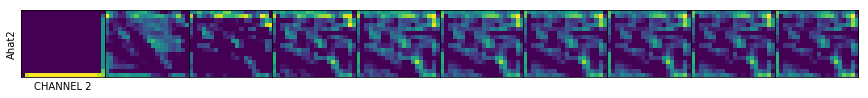

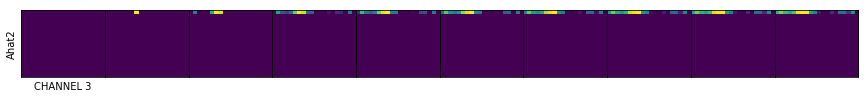

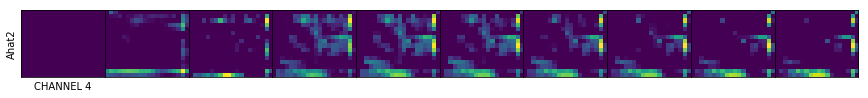

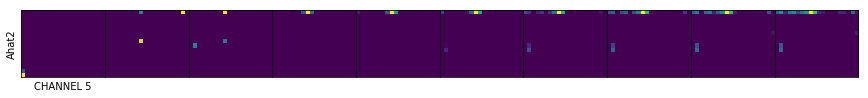

Channel empty:Ahat25


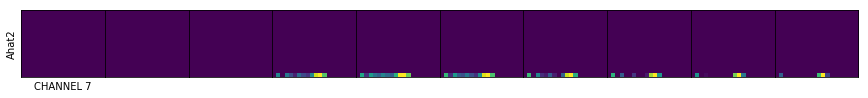

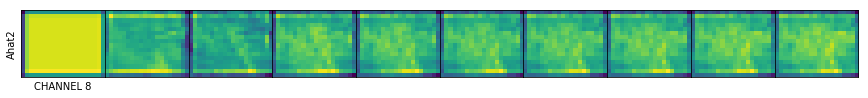

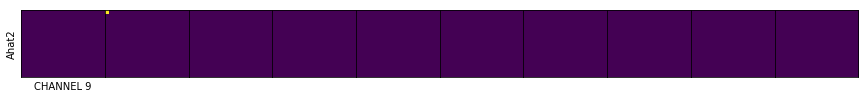

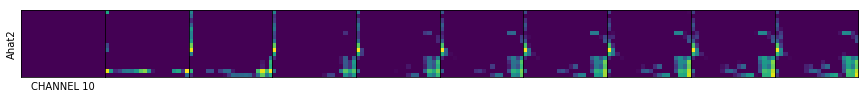

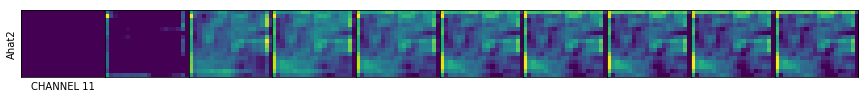

...

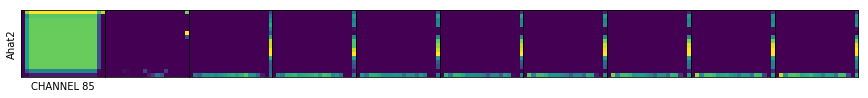

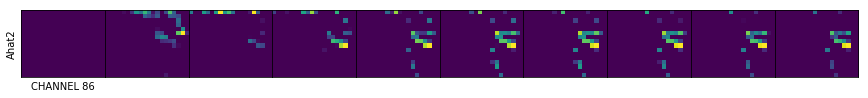

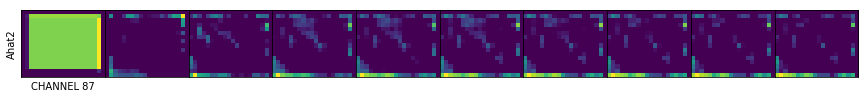

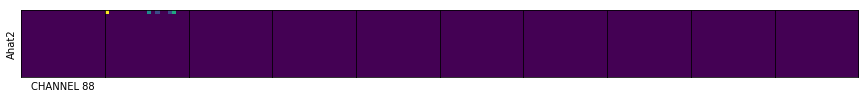

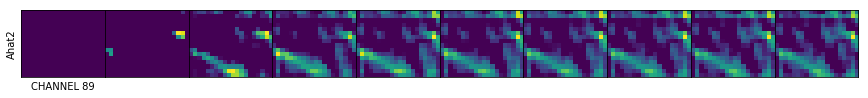

KeyboardInterrupt: 

In [59]:
moving_closer_to_cam =  [(x_hat[0][6][0:10], x_hat[1]) for x_hat in X_hats]
plot_everything(moving_closer_to_cam)

In [38]:
this = [(x[0][5], x[1]) for x in X_hats]

In [52]:
[(x[0][7], x[1]) for x in X_hats]

[(array([[[[-0.01427421, -0.00651556,  0.00193619],
           [-0.01525458, -0.00718298,  0.0018889 ],
           [-0.01525782, -0.0072241 ,  0.00191033],
           ...,
           [-0.01520145, -0.0072133 ,  0.00189311],
           [-0.01510625, -0.00720172,  0.00183046],
           [-0.01370441, -0.00717085,  0.0013639 ]],
  
          [[-0.0150188 , -0.00737936,  0.00184353],
           [-0.01620691, -0.00797994,  0.00200778],
           [-0.01620546, -0.0080285 ,  0.0020533 ],
           ...,
           [-0.01612819, -0.00809632,  0.00208207],
           [-0.01601042, -0.00809179,  0.00199632],
           [-0.01453894, -0.00790192,  0.00151009]],
  
          [[-0.01517   , -0.00737233,  0.00184507],
           [-0.01648135, -0.00799744,  0.00204234],
           [-0.01646442, -0.00802587,  0.00209926],
           ...,
           [-0.01638389, -0.00808461,  0.00210558],
           [-0.01622437, -0.00811994,  0.00204895],
           [-0.01466307, -0.00790784,  0.00154359]],
  
    

#### Sample 2: Showing something to the camera
* original video

In [ ]:
np.all([[1,0],[0,0]]==0.0)

In [40]:
((moving_closer_to_cam)[0][1])

'R0'

In [53]:
def get_zeros(X_hats, ind):
    array = [(x[0][ind], x[1]) for x in X_hats]
    zeros = defaultdict(int)
   
    for model in range(len(array)):
        array_t =  np.transpose(array[model][0],(3,0,1,2))       
        for channel in range(np.shape(array_t)[0]):
            output = array_t[channel]
            if np.all(output == np.float(0)):
                zeros[array[model][1]]+=1
        
        zeros[array[model][1]] = round(zeros[array[model][1]] / np.shape(array_t)[0], 2)
                                         
    return dict(zeros)

for ind in range(8):
    dic = get_zeros(X_hats, ind)
    f = open(str(ind)+'.txt', 'w')
    f.write("% of empty channels")
    f.write("\n")
    f.writelines(sorted([(str(key)+": \t" + str(dic[key])+'\n') for key in dic.keys()]))
    f.close()

In [ ]:
plot_video(X_test[5])

* all (part, layer, channel) outputs of the prednet for frames 15-25

In [ ]:
showing_to_cam = [(x_hat[0][5][15:25], x_hat[1]) for x_hat in X_hats]
plot_everything(showing_to_cam)

#### Sample 3: Spinning something that quickly stops spinning
* original video

In [ ]:
plot_video(X_test[1])

* all (part, layer, channel) outputs of the prednet for frames 5-15

In [ ]:
spinning = [(x_hat[0][1][5:15], x_hat[1]) for x_hat in X_hats]
plot_everything(spinning)

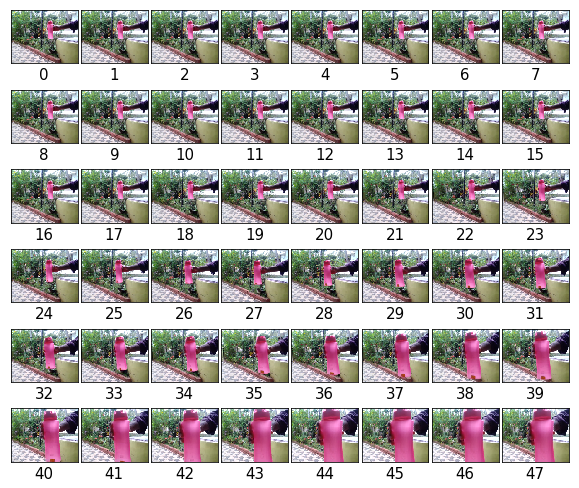

In [132]:
vid =  [(x_hat[0][6], x_hat[1]) for x_hat in X_hats if x_hat[1][0]=="R"]
plot_video(X_test[6])

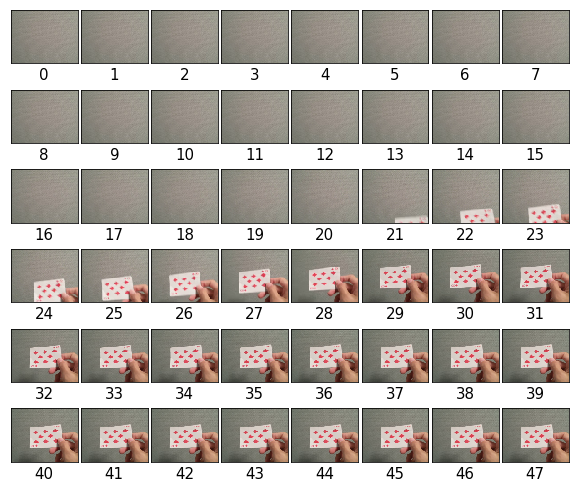

In [136]:
vid2 = [(x_hat[0][5], x_hat[1]) for x_hat in X_hats if x_hat[1][0]=="R"]
plot_video(X_test[5])

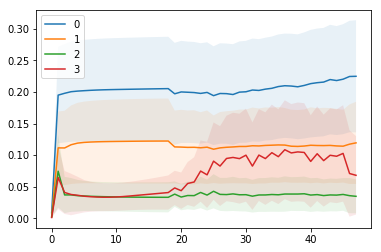

In [162]:
#layer shape no_frames X Y no_channels e.g. R0: (48,64,80,3)
#average bit value / frame
from collections import defaultdict

def plot_changes_in_r(vid, std_param=0.5):
    frames = defaultdict(lambda : defaultdict(float))
    for channel in range(len(vid)):
        for ind, frame in enumerate(vid[channel][0]):   
            frames[channel][ind] = (np.average(np.abs(frame)), np.std(np.abs(frame)))


        x = [n for n in range(48)]
        y = [tup[0] for tup in frames[channel].values()]
        std = [tup[1] for tup in frames[channel].values()]

        plt.plot(x, y, label=channel)
        plt.fill_between(x, [(val-std_param*dev) for val,dev in zip(y,std)], 
                         [(val+std_param*dev) for val,dev in zip(y,std)],
                        alpha=0.1)
        plt.legend()
        plt.show

plot_changes_in_r(vid, std_param=0.5)plot_changes_in_r(vid, std_param=0.5)

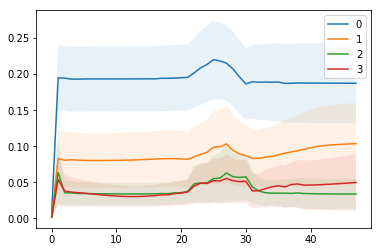

In [163]:
plot_changes_in_r(vid2, std_param=0.5)